<a href="https://colab.research.google.com/github/Alexander-ha/AniParser-FEM/blob/master/Syomin_model_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [125]:
from google.colab import files
files.upload()

Saving cellular_2_12.csv to cellular_2_12.csv
Saving cellular_3_8.csv to cellular_3_8.csv
Saving cellular_4_6.csv to cellular_4_6.csv
Saving cellular_4_12.csv to cellular_4_12 (1).csv
Saving cellular_4_24.csv to cellular_4_24 (1).csv
Saving cellular_6_4.csv to cellular_6_4.csv
Saving cellular_6_64.csv to cellular_6_64 (1).csv
Saving cellular_8_3.csv to cellular_8_3.csv
Saving cellular_8_6.csv to cellular_8_6.csv
Saving cellular_8_12.csv to cellular_8_12 (1).csv
Saving cellular_8_48.csv to cellular_8_48 (1).csv
Saving cellular_12_2.csv to cellular_12_2.csv
Saving cellular_12_4.csv to cellular_12_4 (1).csv
Saving cellular_12_8.csv to cellular_12_8 (1).csv
Saving cellular_24_4.csv to cellular_24_4 (1).csv
Saving mechanics_2_12.csv to mechanics_2_12.csv
Saving mechanics_3_8.csv to mechanics_3_8.csv
Saving mechanics_4_6.csv to mechanics_4_6.csv
Saving mechanics_4_12.csv to mechanics_4_12 (1).csv
Saving mechanics_4_24.csv to mechanics_4_24 (1).csv
Saving mechanics_6_4.csv to mechanics_6_4.cs

{'cellular_2_12.csv': b'ode_solve_time\r\n4.44953\r\n3.44132\r\n2.78516\r\n2.46853\r\n2.22166\r\n1.83315\r\n1.14868\r\n1.32244\r\n1.48829\r\n1.4974\r\n1.48954\r\n1.49058\r\n1.48987\r\n1.40309\r\n1.35187\r\n1.3499\r\n1.35268\r\n1.35411\r\n1.34979\r\n1.35316\r\n2.97719\r\n2.29309\r\n1.97084\r\n1.8092\r\n1.73569\r\n1.56035\r\n1.48575\r\n1.48793\r\n1.45403\r\n1.35045\r\n1.35318\r\n1.34068\r\n1.34558\r\n1.34586\r\n1.23821\r\n1.23862\r\n1.24\r\n1.24509\r\n1.23611\r\n1.23722\r\n2.15039\r\n1.76867\r\n1.54854\r\n1.46167\r\n1.43593\r\n1.40713\r\n1.35452\r\n1.33491\r\n1.31225\r\n1.30592\r\n1.2971\r\n1.24968\r\n1.23889\r\n1.24187\r\n1.24386\r\n1.23965\r\n1.24087\r\n1.24066\r\n1.24233\r\n1.24414\r\n1.38024\r\n1.37945\r\n1.32688\r\n1.28165\r\n1.26159\r\n1.24864\r\n1.23329\r\n1.20806\r\n1.20931\r\n1.20119\r\n1.19709\r\n1.19154\r\n1.18725\r\n1.17881\r\n1.17337\r\n1.16838\r\n1.15068\r\n1.11349\r\n1.07969\r\n1.07989\r\n1.26831\r\n1.21654\r\n1.19503\r\n1.17488\r\n1.17421\r\n1.15563\r\n1.12857\r\n1.12439\

In [11]:
import os

In [54]:
from google.colab import files
files.download('result_time_12_4.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [12]:
import re
import csv

input_file = 'slurm-4534602.out'

patterns = {
    'assm_time': r'assm_time\s*=\s*([0-9]*\.?[0-9]+)s',
    'prec_update_time': r'prec_update_time\s*=\s*([0-9]*\.?[0-9]+)s',
    'solving': r'solving\s*=\s*([0-9]*\.?[0-9]+)s',
    'ode_solve_time': r'ode_solve_time\s*=\s*([0-9]*\.?[0-9]+)s',
    'mechanics': r'wtime\s*=\s*([0-9]*\.?[0-9]+)s:.*Mechanics: (Begin|End)',
    'rhs_assm_time': r'RHSAssmTime\s*=\s*([0-9]*\.?[0-9]+)s',
    'mat_assm_time': r'MatAssmTime\s*=\s*([0-9]*\.?[0-9]+)s'
}

assm_times = []
prec_update_times = []
solving_times = []
ode_solve_times = []
mechanics_data = []
rhs_assm_times = []
mat_assm_times = []
last_wtime = None

with open(input_file, 'r') as file:
    for line in file:
        if match := re.search(patterns['assm_time'], line):
            assm_times.append(float(match.group(1)))
        if match := re.search(patterns['prec_update_time'], line):
            prec_update_times.append(float(match.group(1)))
        if match := re.search(patterns['solving'], line):
            solving_times.append(float(match.group(1)))
        if match := re.search(patterns['ode_solve_time'], line):
            ode_solve_times.append(float(match.group(1)))
        if match := re.search(patterns['mechanics'], line):
            mechanics_data.append((float(match.group(1)), match.group(2)))
        if match := re.search(patterns['rhs_assm_time'], line):
            rhs_assm_times.append(float(match.group(1)))
        if match := re.search(patterns['mat_assm_time'], line):
            mat_assm_times.append(float(match.group(1)))
        if match := re.search(r'wtime\s*=\s*([0-9]*\.?[0-9]+)s', line):
            last_wtime = float(match.group(1))

with open('mndmn_6_64.csv', 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['assm_time', 'prec_update_time', 'solving'])
    max_len = max(len(assm_times), len(prec_update_times), len(solving_times))
    for i in range(max_len):
        writer.writerow([
            assm_times[i] if i < len(assm_times) else '',
            prec_update_times[i] if i < len(prec_update_times) else '',
            solving_times[i] if i < len(solving_times) else ''
        ])

with open('cellular_6_64.csv', 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['ode_solve_time'])
    for time in ode_solve_times:
        writer.writerow([time])

with open('mechanics_6_64.csv', 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['wtime', 'Mechanics'])
    for time, state in mechanics_data:
        writer.writerow([time, state])

with open('result_time_6_64.csv', 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['last_wtime'])
    if last_wtime is not None:
        writer.writerow([last_wtime])

In [126]:
import pandas as pd
import re
import csv
import os

In [127]:
result_time = []

In [128]:
mech_time = []

In [129]:
cellular_time = []

In [130]:
mndmn_time = []

In [131]:
# Вспомогательные функции для добавления файлов в виде кортежа {(MPI_num,OPENMP_num), имя_файла}
# Для визуализации тепловой карты времени счета на координатной сетке - X: MPI, Y: OpenMP
def add_files_to_array(array, filename):
    match = re.search(r'_(\d+)_(\d+)\.csv$', filename)
    if match:
        num1, num2 = match.groups()
        array.append(((int(num1), int(num2)), pd.read_csv(filename), filename))

for file in os.listdir('/content'):
    if file.startswith("result_time"):
        add_files_to_array(result_time, file)
    elif file.startswith("mechanics"):
        add_files_to_array(mech_time, file)
    elif file.startswith("cellular"):
        add_files_to_array(cellular_time, file)
    elif file.startswith("mndmn"):
        add_files_to_array(mndmn_time, file)


In [86]:
def summarize_time_with_pairs(time_array):
    summarized_data = []
    for (num_pair, file, filename) in time_array:
        if "mndmn" in filename:
          total_time = [file['assm_time'][:-1].sum()/60, file['prec_update_time'][:-1].sum()/60, file['solving'][:-1].sum()/60]
          summarized_data.append((total_time, num_pair))
        if "result" in filename:
          total_time = [file['last_wtime'].sum()/60]
          summarized_data.append((total_time, num_pair))
        if "mech" in filename:
          total_time = [sum(-file['wtime'].iloc[j] if file['Mechanics'].iloc[j] == 'Begin' and j < len(file) - 1 else file['wtime'].iloc[j] for j in range(len(file)))/60]
          summarized_data.append((total_time, num_pair))
        if "cellular" in filename:
          total_time = [file['ode_solve_time'].sum()/60]
          summarized_data.append((total_time, num_pair))
    return summarized_data

In [132]:
mndmn_summarized = summarize_time_with_pairs(mndmn_time)
mech_summarized = summarize_time_with_pairs(mech_time)
result_summarized = summarize_time_with_pairs(result_time)
cellular_summarized = summarize_time_with_pairs(cellular_time)

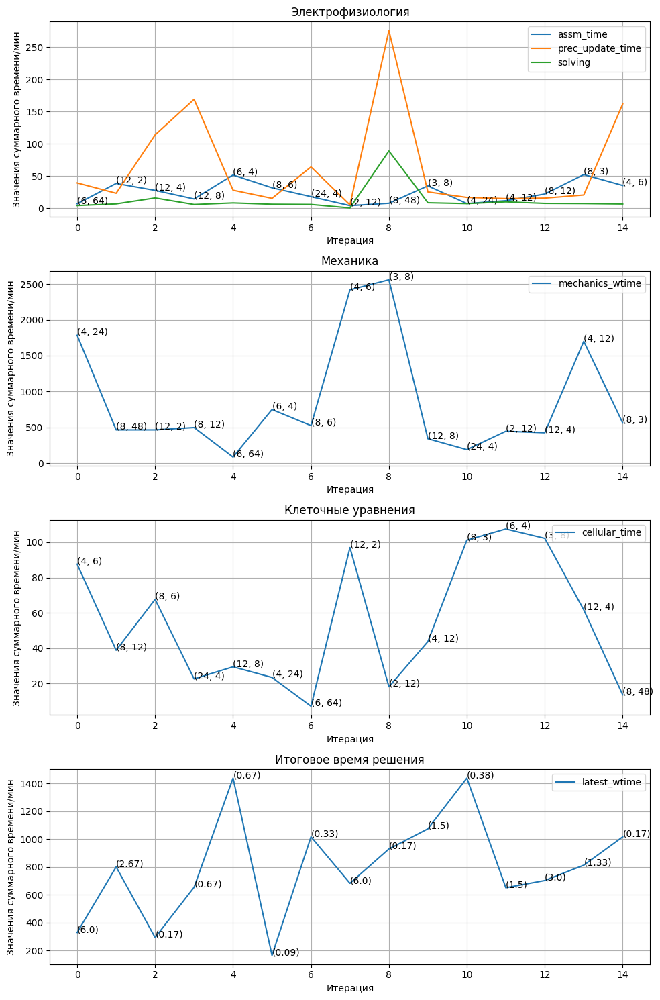

In [135]:
from matplotlib import pyplot as plt
import numpy as np
fig, axs = plt.subplots(4, 1, figsize=(10, 15))


axs[0].plot([i for i in range(len(mndmn_summarized))], [mndmn_summarized[i][0][0] for i in range(len(mndmn_summarized))], label=f'assm_time')
axs[0].plot([i for i in range(len(mndmn_summarized))], [mndmn_summarized[i][0][1] for i in range(len(mndmn_summarized))], label=f'prec_update_time')
axs[0].plot([i for i in range(len(mndmn_summarized))], [mndmn_summarized[i][0][2] for i in range(len(mndmn_summarized))], label=f'solving')
axs[0].set_title(f'Электрофизиология')
axs[0].set_xlabel('Итерация')
axs[0].set_ylabel('Значения суммарного времени/мин')
pairs = [mndmn_summarized[i][1] for i in range(len(mndmn_summarized))]
for i, pair in enumerate(pairs):
        axs[0].annotate(f"({pair[0]}, {pair[1]})", (i, mndmn_summarized[i][0][0]))
axs[0].legend()
axs[0].grid()

axs[1].plot([i for i in range(len(mech_summarized))], [mech_summarized[i][0] for i in range(len(mech_summarized))], label=f'mechanics_wtime')
axs[1].set_title(f'Механика')
axs[1].set_xlabel('Итерация')
axs[1].set_ylabel('Значения суммарного времени/мин')
pairs = [mech_summarized[i][1] for i in range(len(mech_summarized))]
for i, pair in enumerate(pairs):
        axs[1].annotate(f"({pair[0]}, {pair[1]})", (i, mech_summarized[i][0][0]))

axs[1].legend()
axs[1].grid()

axs[2].plot([i for i in range(len(cellular_summarized))], [cellular_summarized[i][0] for i in range(len(cellular_summarized))], label=f'cellular_time')
axs[2].set_title(f'Клеточные уравнения')
axs[2].set_xlabel('Итерация')
axs[2].set_ylabel('Значения суммарного времени/мин')
pairs = [cellular_summarized[i][1] for i in range(len(cellular_summarized))]
for i, pair in enumerate(pairs):
        axs[2].annotate(f"({pair[0]}, {pair[1]})", (i, cellular_summarized[i][0][0]))
axs[2].legend()
axs[2].grid()

axs[3].plot([i for i in range(len(result_summarized))], [result_summarized[i][0] for i in range(len(result_summarized))], label=f'latest_wtime')
axs[3].set_title(f'Итоговое время решения')
axs[3].set_xlabel('Итерация')
axs[3].set_ylabel('Значения суммарного времени/мин')
pairs = [result_summarized[i][1] for i in range(len(result_summarized))]
for i, pair in enumerate(pairs):
        axs[3].annotate(f"({round(pair[0]/pair[1], 2)})", (i, result_summarized[i][0][0]))
axs[3].legend()
axs[3].grid()

plt.tight_layout()

plt.show()

Запуск 1ый: Соотношение MPI/OpenMP = 4/6. Результаты:

Результирующее время:

In [ ]:
result_time.append(pd.read_csv("result_time_4_6.csv"))

Механика:

In [ ]:
mech_time.append(pd.read_csv("mechanics_4_6.csv"))

Клеточные уравнения

In [ ]:
cellular_time.append(pd.read_csv("cellular_4_6.csv"))

EP Monodomain



In [ ]:
mndmn_time.append(pd.read_csv("mndmn_4_6.csv")[:-1])



```
# Выбран кодовый формат
```

Запуск 2: Соотношение MPI/OpenMP = 3/8. Результаты:

In [ ]:
result_time.append(pd.read_csv("result_time_3_8.csv"))

In [ ]:
mech_time.append(pd.read_csv("mechanics_3_8.csv"))

In [ ]:
cellular_time.append(pd.read_csv("cellular_3_8.csv"))

In [ ]:
mndmn_time.append(pd.read_csv("mndmn_3_8.csv")[:-1])

Нынешний запуск 3: - 6/8

In [ ]:
result_time.append(pd.read_csv("result_time_6_8.csv"))
mech_time.append(pd.read_csv("mechanics_6_8.csv"))
cellular_time.append(pd.read_csv("cellular_6_8.csv"))
mndmn_time.append(pd.read_csv("mndmn_6_8.csv")[:-1])

Запуск 4: - 2/12


In [ ]:
result_time.append(pd.read_csv("result_time_2_12.csv"))
mech_time.append(pd.read_csv("mechanics_2_12.csv"))
cellular_time.append(pd.read_csv("cellular_2_12.csv"))
mndmn_time.append(pd.read_csv("mndmn_2_12.csv")[:-1])

Запуск 5: - 8/3


In [ ]:
result_time.append(pd.read_csv("result_time_2_12.csv"))
mech_time.append(pd.read_csv("mechanics_2_12.csv"))
cellular_time.append(pd.read_csv("cellular_2_12.csv"))
mndmn_time.append(pd.read_csv("mndmn_2_12.csv")[:-1])

Запуск 6: - 6/4

In [ ]:
result_time.append(pd.read_csv("result_time_2_12.csv"))
mech_time.append(pd.read_csv("mechanics_2_12.csv"))
cellular_time.append(pd.read_csv("cellular_2_12.csv"))
mndmn_time.append(pd.read_csv("mndmn_2_12.csv")[:-1])

Запуск 7: - 12/2


In [ ]:
result_time.append(pd.read_csv("result_time_2_12.csv"))
mech_time.append(pd.read_csv("mechanics_2_12.csv"))
cellular_time.append(pd.read_csv("cellular_2_12.csv"))
mndmn_time.append(pd.read_csv("mndmn_2_12.csv")[:-1])

24: 2/12 - slurm81 8/3 - slurm82 6/4 - slurm83 12/2 - slurm84
48: 8/6 - slurm86 4/12 - slurm87 12/4 - slurm88
96: 4/24 - slurm93 8/12 - slurm94 24/4 4/24

______________________________________________________________________
Запуски для 48:

Запуск 8: 8/6

Запуск 9: 4/12

Запуск 10: 12/4

Запуск 11: 2/24

Запуск 12: 24/2

Запуски 96:

Запуск 12: 4/24

Запуск 13: 24/4

Запуск 14: 8/12

Запуск 15: 12/8



Запуски 384:

Запуск 16: 8/48

Запуск 17: 12/8

Запуск 18: 48/8

Визуализация графиков

In [ ]:
# Генератор контейнеров для сумм по времени в случае визуализации явной зависимости времени счета от итерации
for_plot_mndmn_time = [[mndmn_time[i]['assm_time'].sum()/60 for i in range(len(mndmn_time))], [mndmn_time[i]['prec_update_time'].sum()/60 for i in range(len(mndmn_time))], [mndmn_time[i]['solving'].sum()/60 for i in range(len(mndmn_time))]]
for_plot_cellular_time = [cellular_time[i]['ode_solve_time'].sum()/60 for i in range(len(cellular_time))]
for_plor_mech_time = [sum(-mech_time[i]['wtime'].iloc[j] if mech_time[i]['Mechanics'].iloc[j] == 'Begin' and j < len(mech_time[i]) - 1 else mech_time[i]['wtime'].iloc[j] for j in range(len(mech_time[i])))/60 for i in range(len(mech_time))]
for_plot_result_time = [result_time[i]['last_wtime'].sum()/60 for i in range(len(result_time))]

In [ ]:
from matplotlib import pyplot as plt

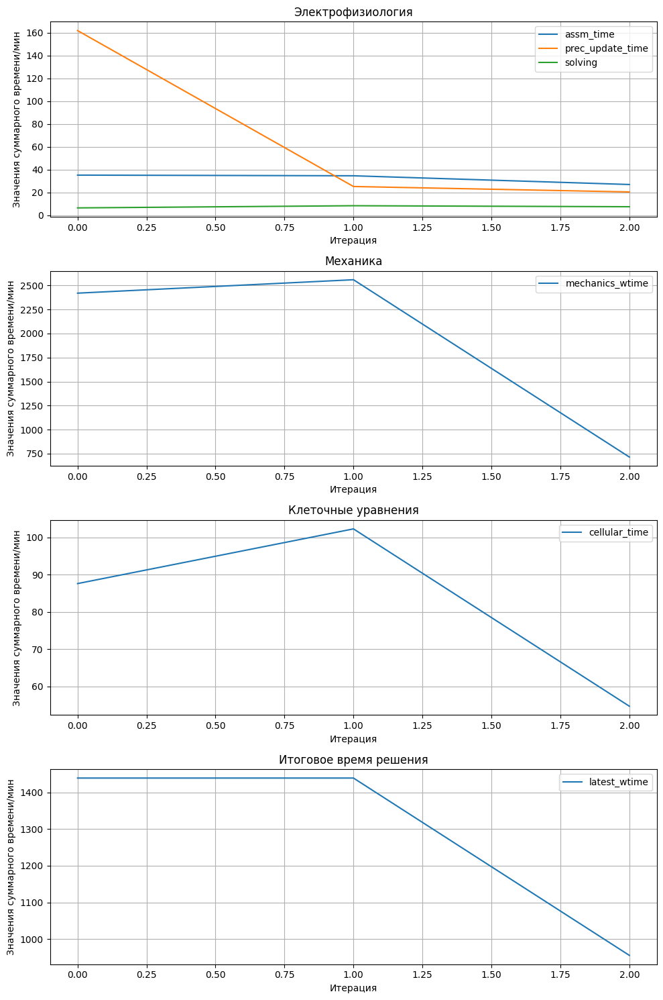

In [ ]:
fig, axs = plt.subplots(4, 1, figsize=(10, 15))

iters = [0, 1, 2]
axs[0].plot(iters, for_plot_mndmn_time[0], label=f'assm_time')
axs[0].plot(iters, for_plot_mndmn_time[1], label=f'prec_update_time')
axs[0].plot(iters, for_plot_mndmn_time[2], label=f'solving')
axs[0].set_title(f'Электрофизиология')
axs[0].set_xlabel('Итерация')
axs[0].set_ylabel('Значения суммарного времени/мин')
axs[0].legend()
axs[0].grid()

axs[1].plot(iters, for_plor_mech_time, label=f'mechanics_wtime')
axs[1].set_title(f'Механика')
axs[1].set_xlabel('Итерация')
axs[1].set_ylabel('Значения суммарного времени/мин')
axs[1].legend()
axs[1].grid()

axs[2].plot(iters, for_plot_cellular_time, label=f'cellular_time')
axs[2].set_title(f'Клеточные уравнения')
axs[2].set_xlabel('Итерация')
axs[2].set_ylabel('Значения суммарного времени/мин')
axs[2].legend()
axs[2].grid()

axs[3].plot(iters, for_plot_result_time, label=f'latest_wtime')
axs[3].set_title(f'Итоговое время решения')
axs[3].set_xlabel('Итерация')
axs[3].set_ylabel('Значения суммарного времени/мин')
axs[3].legend()
axs[3].grid()
plt.tight_layout()

plt.show()



In [ ]:
mech_time[0]

,wtime,Mechanics
0,192.752,Begin
1,256.201,End
2,383.034,Begin
3,453.690,End
4,567.860,Begin
...,...,...
1398,86134.200,Begin
1399,86212.900,End
1400,86247.000,Begin
1401,86325.700,End


In [ ]:
print(for_plot_result_time)

[1439.345, 1439.3316666666665]
